In [4]:
from PIL import Image
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
from tqdm import tqdm
from ultralytics import YOLO 
import torch

model = YOLO('C:/Users/Usuario/Documents/GitHub/ANPR-GIA/yolo11n_licenseplates.pt')
test_images_dir = 'C:/Users/Usuario/Documents/GitHub/ANPR-GIA/Datasets/test/images'

In [29]:
def train_yolov11(
		data_yaml,
		weights='yolo11n.pt',
		img_size=640,
		batch_size=16,
		epochs=50,
		device='0'
):
	"""
	Function to train YOLOv11 with a specified dataset.

	Parameters:
	- data_yaml: Path to the data.yaml file (specifying paths to train/val and class info)
	- weights: Path to the pretrained weights (default: yolov11s.pt)
	- img_size: Image size (default: 640)
	- batch_size: Batch size (default: 16)
	- epochs: Number of epochs for training (default: 100)
	- device: Device to run on ('0' for GPU, 'cpu' for CPU)
	"""
	print(f"Starting YOLOv11 training with {epochs} epochs on device {device}")
	model = YOLO(weights).to(device)
	model.train(
		data=data_yaml,
		imgsz=img_size,
		epochs=epochs,
		device=device
	)
	model.save('yolo11n_finetuned.pt')
	print("Training Complete.")

def run_inference(weights_path, source, img_size=640, conf_thresh=0.25, device='0'):
	"""
	Function to run inference using the trained YOLOv11 model.

	Parameters:
	- weights_path: Path to the trained weights
	- source: Directory or image path to run inference on
	- img_size: Image size for inference (default: 640)
	- conf_thresh: Confidence threshold (default: 0.25)
	- device: Device to run on ('0' for GPU, 'cpu' for CPU)
	"""
	print(f"Running inference on images in {source}")
	model = YOLO(weights_path).to(device)
	image_filenames = [filename for filename in os.listdir(source) if filename.endswith(('.jpg', '.jpeg'))]
	image_paths = [os.path.join(source, filename) for filename in image_filenames]
	results = [model(img_path, imgsz=img_size) for img_path in image_paths]
	print("Inference Complete.")
	return results

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

Using device: cuda


In [30]:
results_yolo = run_inference('C:/Users/Usuario/Documents/GitHub/ANPR-GIA/yolo11n_licenseplates.pt', test_images_dir, device=device)
print(results_yolo)

Running inference on images in C:/Users/Usuario/Documents/GitHub/ANPR-GIA/Datasets/test/images/

image 1/1 C:\Users\Usuario\Documents\GitHub\ANPR-GIA\Datasets\test\images\0550HNN_jpg.rf.79fa3912c92496ee635323f4eb29276c.jpg: 640x640 1 license_plate, 69.5ms
Speed: 2.1ms preprocess, 69.5ms inference, 8.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\Usuario\Documents\GitHub\ANPR-GIA\Datasets\test\images\1062FNT_jpg.rf.e25368be438c8a1674da49f87b0195a6.jpg: 640x640 1 license_plate, 57.1ms
Speed: 8.4ms preprocess, 57.1ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\Usuario\Documents\GitHub\ANPR-GIA\Datasets\test\images\1111LRB_jpg.rf.9408c5a550f980ad9d44e3845a0bdcf4.jpg: 640x640 1 license_plate, 16.5ms
Speed: 0.0ms preprocess, 16.5ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 C:\Users\Usuario\Documents\GitHub\ANPR-GIA\Datasets\test\images\2273JVP_jpg.rf.6a971ddd461ac5611be56183ac4cde42.jpg: 640x6

In [31]:
results_yolo[0]

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'license_plate'}
 obb: None
 orig_img: array([[[217, 198, 171],
         [217, 198, 171],
         [217, 198, 171],
         ...,
         [227, 217, 210],
         [227, 217, 210],
         [226, 216, 209]],
 
        [[217, 198, 171],
         [217, 198, 171],
         [217, 198, 171],
         ...,
         [226, 216, 209],
         [226, 216, 209],
         [226, 216, 209]],
 
        [[217, 198, 171],
         [217, 198, 171],
         [217, 198, 171],
         ...,
         [225, 215, 208],
         [225, 215, 208],
         [225, 215, 208]],
 
        ...,
 
        [[167, 163, 158],
         [167, 163, 158],
         [168, 164, 159],
         ...,
         [ 44,  42,  42],
         [ 49,  44,  45],
         [ 48,  43,  44]],
 
        [[170, 166, 161],
         [170, 166, 161],
         [171, 167, 162],
         ...,
         [ 

In [44]:
box = results_yolo[0][0].boxes.xyxy[0].cpu().numpy().astype(int).tolist()
size = results_yolo[4][0].orig_img 
print((size.shape))

(640, 640, 3)


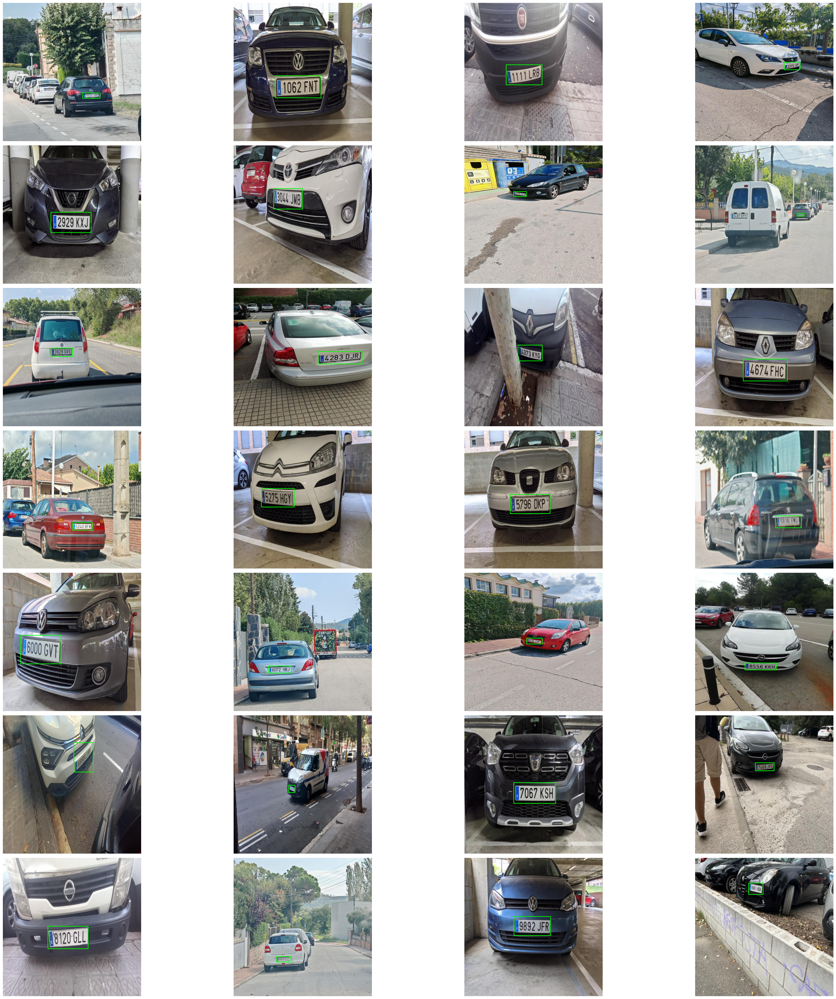

In [54]:
import cv2
import matplotlib.pyplot as plt
import math

# Determine the number of rows and columns for the subplot grid
num_images = len(results_yolo)
cols = 4 # Number of columns (adjust as needed)
rows = math.ceil(num_images / cols)  # Calculate number of rows

# Create subplots
fig, axes = plt.subplots(rows, cols, figsize=(35, 35))

# Flatten the axes array for easy indexing
axes = axes.flatten()

# Loop over the images and display them in subplots
for idx, result in enumerate(results_yolo):
	result = result[0]
	img = result.orig_img
	box = result.boxes.xyxy[0].cpu().numpy().astype(int).tolist()
	if img is not None:
		img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB

		# Draw the bounding box on the image
		x1, y1, x2, y2 = box
		cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)

		# Display the image in the subplot
		axes[idx].imshow(img)
		axes[idx].axis('off')  # Hide the axis
	else:
		print("Could not load image")

# Remove any unused subplots
for i in range(num_images, len(axes)):
	fig.delaxes(axes[i])

# Display the grid of images
plt.tight_layout()
plt.show()


In [73]:
from typing import List, Tuple
def read_ground_truth_annotations(annotation_folder: str, image_filenames: List[str]) -> dict[str, List[Tuple[int, float, float, float, float]]]:
    """
    Read  YOLO annotations

    :param annotation_folder
    :param image_filenames: 
    :return: dictionary with the result of each image
    """
    gt_annotations = {}
    for image_filename in image_filenames:
        base_name = os.path.splitext(image_filename)[0]
        annotation_file = os.path.join(annotation_folder, f"{base_name}.txt")
        annotations = []
        if os.path.exists(annotation_file):
            with open(annotation_file, 'r') as file:
                for line in file:
                    parts = line.strip().split()
                    if len(parts) == 5:
                        class_id = int(parts[0])
                        x_center = float(parts[1])
                        y_center = float(parts[2])
                        width = float(parts[3])
                        height = float(parts[4])
                        annotations.append((class_id, x_center, y_center, width, height))
        gt_annotations[image_filename] = annotations
    return gt_annotations



In [77]:
image_folder = 'C:/Users/Usuario/Documents/GitHub/ANPR-GIA/Datasets/test/images'
annotation_folder = 'C:/Users/Usuario/Documents/GitHub/ANPR-GIA/Datasets/test/labels'
image_filenames = [f for f in os.listdir(image_folder) if f.endswith('.jpg')]

ground_truths = read_ground_truth_annotations(annotation_folder, image_filenames)

TypeError: 'numpy.ndarray' object is not callable

In [32]:
print(test_images_dir)

C:/Users/Usuario/Documents/GitHub/ANPR-GIA/images/reduced


In [65]:
import cv2
from PIL import Image
import numpy as np
import os
import matplotlib.pyplot as plt
from tqdm import tqdm
test_images_dir = 'C:/Users/Usuario/Documents/GitHub/ANPR-GIA/Datasets/test/images/'
# list images
path = test_images_dir
images = [path+img for img in os.listdir(path) if img.endswith(".jpg") or img.endswith(".jpeg")]
n = len(images)
images = images[:n]

def get_size(aspect):
	"""
	If aspect is str, must be SD, HD, FHD, 2K, 4K.\n	
	If aspect is tuple, must be like (1280, -1, (16, 9)) to get like 1280x720.
	"""
	resolutions = {"SD": (640, 480), "HD": (1280, 720), "FHD": (1920, 1080), "2K": (2560, 1440), "4K": (3840, 2160)}
	if isinstance(aspect, str):
		return resolutions[aspect]
	elif isinstance(aspect, tuple):
		w, h, ratio = aspect
		assert w != -1 or h != -1, "Only one dimension can be -1"	
		if w == -1:
			w = int(h * ratio[0] / ratio[1])
		elif h == -1:
			h = int(w * ratio[1] / ratio[0])
		return (w, h)

def resize_and_pad(img, target_size=(1280, 720)):
	target_w, target_h = target_size
	h, w = img.shape[:2]
	
	# Calculate the aspect ratio
	aspect_ratio_original = w / h
	aspect_ratio_target = target_w / target_h
	
	# Resize while maintaining aspect ratio
	if aspect_ratio_original > aspect_ratio_target:
		# Image is wider than target, resize based on width
		new_w = target_w
		new_h = int(new_w / aspect_ratio_original)
	else:
		# Image is taller or proportional, resize based on height
		new_h = target_h
		new_w = int(new_h * aspect_ratio_original)
	
	resized_img = cv2.resize(img, (new_w, new_h))
	
	# Padding calculations
	top_pad = (target_h - new_h) // 2
	bottom_pad = target_h - new_h - top_pad
	left_pad = (target_w - new_w) // 2
	right_pad = target_w - new_w - left_pad
	
	# Apply padding using cv2.copyMakeBorder
	padded_img = cv2.copyMakeBorder(
		resized_img, top_pad, bottom_pad, left_pad, right_pad, 
		cv2.BORDER_CONSTANT, value=(0, 0, 0)  # Padding with black
	)
	
	return padded_img

def plot_images(images, rows=2, sep=1, cmap='gray'):
	fig, axs = plt.subplots(rows, n//rows, figsize=(30, n//rows*sep))
	res_images = images[::-1]
	for i, ax in enumerate(axs.flatten()):
		ax.axis('off')
		ax.imshow(res_images.pop(), cmap=cmap)
		# draw i above the image
		ax.text(0, 0, str(i), color='red', fontsize=20, fontweight='bold')
	plt.show()

results = []
originals = []
resized = []
target_size = get_size("HD")
for img_name in (images):
	# print("loading image")
	img = cv2.imread(img_name)
	img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
	originals.append(img)

	# make image of fixed size (small for speed)
	# print("resizing")
	img = resize_and_pad(img, target_size)
	resized.append(img)

	# gray
	# print("converting to gray")
	gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
	gray = cv2.GaussianBlur(gray, (11, 11), 0)

	# black hat
	# print("black hat")
	structuring_element = np.zeros((15, 15), np.uint8)
	structuring_element[1:-1, 1:-1] = 1
	black_hat = cv2.morphologyEx(gray, cv2.MORPH_BLACKHAT, structuring_element)

	# open
	# print("open")
	structuring_element = np.zeros((5, 5), np.uint8)
	structuring_element[1:-1, 1:-1] = 1
	open = cv2.morphologyEx(black_hat, cv2.MORPH_OPEN, structuring_element, iterations=2)
	
	# print("rect black hat")
	rect_structuring_element = np.zeros((10, 100), np.uint8)
	rect_structuring_element[1:-1, 1:-1] = 1

	rect_black_hat = cv2.morphologyEx(open, cv2.MORPH_BLACKHAT, rect_structuring_element)

	# print("binarizing")
	# _, binarized = cv2.threshold(rect_black_hat, 10, 255, cv2.THRESH_BINARY)
	# binarized = cv2.adaptiveThreshold(rect_black_hat, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
	# blur = cv2.GaussianBlur(rect_black_hat, (5, 5), 0)
	# _, binarized = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)


	results.append(rect_black_hat)

[array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8), array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8), array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8), array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8), array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0

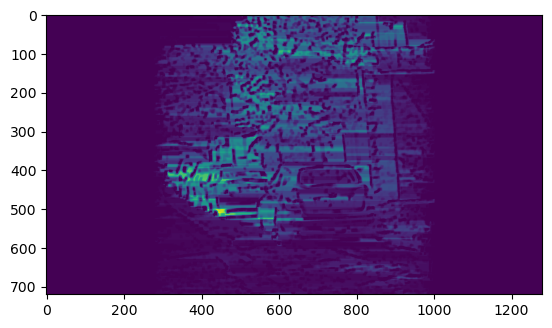

In [66]:
print(results)
plt.imshow(results[0])

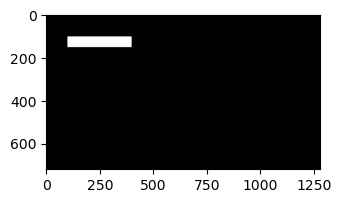

In [67]:
patch_size = (50, 300)
patch = np.ones(patch_size, np.uint8)*255
img = resized[0]

canvas = np.zeros_like(img[:,:,0], dtype=np.uint8)
canvas[100:100+patch_size[0], 100:100+patch_size[1]] = patch
plt.figure(figsize=(5, 2))
plt.imshow(canvas, cmap='gray', vmin=0, vmax=255)

In [68]:
import time

detections = []
heatmaps = []
for i in range(n):
	a = results[i].astype(np.uint8)
	b = patch.astype(np.uint8)

	result = cv2.matchTemplate(a, b, cv2.TM_CCORR)
	heatmaps.append(result)

	min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)

	top_left = max_loc
	h, w = b.shape[:2]
	bottom_right = (top_left[0] + w, top_left[1] + h)
	img = resized[i].copy()
	a = cv2.rectangle(img, top_left, bottom_right, (255, 0, 0), 5)
	detections.append(a)

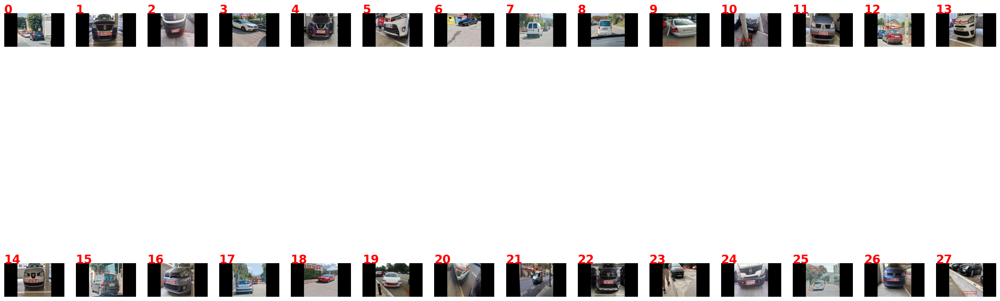

In [69]:
plot_images(detections)

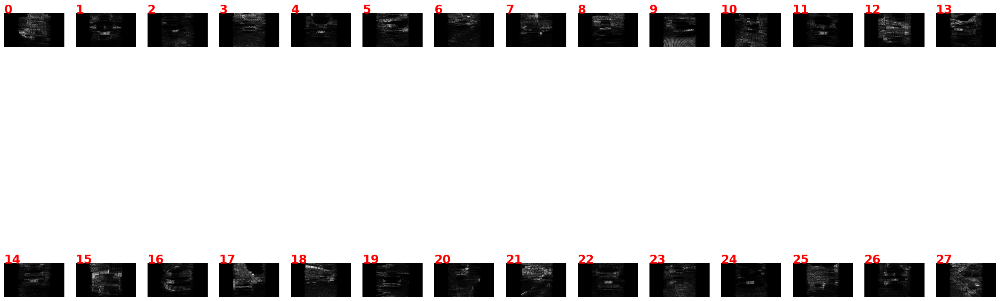

In [50]:
plot_images(results)

In [23]:
print(len(detections))
print(results)

28


In [ ]:
annotatins_dir = 'C:/Users/Usuario/Documents/GitHub/ANPR-GIA/Datasets/test/labels'


def adjust_annotations(orig_w, orig_h, target_w, target_h, new_w, new_h, left_pad, top_pad, annotations):
    adjusted_annotations = []
    for ann in annotations:
        class_id, x_center_norm, y_center_norm, width_norm, height_norm = ann
        # Convert normalized coordinates to absolute coordinates in original image
        x_center = x_center_norm * orig_w
        y_center = y_center_norm * orig_h
        width = width_norm * orig_w
        height = height_norm * orig_h
        # Scale to new size
        scale_w = new_w / orig_w
        scale_h = new_h / orig_h
        x_center_resized = x_center * scale_w
        y_center_resized = y_center * scale_h
        width_resized = width * scale_w
        height_resized = height * scale_h
        # Adjust for padding
        x_center_padded = x_center_resized + left_pad
        y_center_padded = y_center_resized + top_pad
        # Normalize to final image size
        x_center_norm_padded = x_center_padded / target_w
        y_center_norm_padded = y_center_padded / target_h
        width_norm_padded = width_resized / target_w
        height_norm_padded = height_resized / target_h
        # Append adjusted annotation
        adjusted_annotations.append((class_id, x_center_norm_padded, y_center_norm_padded, width_norm_padded, height_norm_padded))
    return adjusted_annotations